<a href="https://colab.research.google.com/github/ClintonGJohnson/CourseraDataScience/blob/master/Coursera_DataScience_CapstoneProject_wk2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Coursera Data Science Program: Capstone Project (Week 2)
**Author:** *Clinton Johnson*

## Table of contents
* [Introduction](#introduction)
  * [Business Problem](#business)
* [Data](#data)
* [Methodology](#methodology)


## Introduction <a name="introduction"></a>
Discussing the business problem and who would be interested in this project

* Business Problem
* Stakeholders

### Business Problem <a name="business"></a>
Discussing the business problem

#### Background
Racial inequities plague communities around the US, affecting the health and well-being of people of color and other racialized groups and ultimately limiting the capacity and progress of the cities, states, and regions where they persist. 

##### What is Racial Inequity?
A racial inequity exists when there are significant disparities in:
* availability of community resources (like access to quality schools), 
* exposure to harmful community conditions (like exposure to toxins in the air), and
* education, health, or economic results (like disparities in educational attainment)

Racial inequities can be determined when race, ethnicity, religion, language, country of origin, or other typically racialized characteristics can be used to predict availability of community resources, exposure to harmful community conditions, or people's outcomes.

#### Business Question
This research effort seeks to answer the following question:
> Does the proportion of people of any particular race in a neighborhoods in Philadelphia impact the neighborhood's access to financial services?

### Stakeholders
Discussing stakeholders who might be interested in this project

The following stakeholder groups would be interested in this project:
* Philadelphia Government Leaders and Teams
    * **Commerce Departments** working to assess and increase prosperity for communities in Philadelphai
    * **Health & Human Services Agencies** working to assess and increase prosperity to increase economic resources in Philadelphia, recognizing that the social determinants of health suggests a link between health and financial well-being
    * **Community-based Organizations (CBOs)** working to increase prosperity in communities in Philadelphia
    * **Financial Services Institutions** working to expand into new business areas.
    * **Philadelphia's Constituents** living, working, pursuing entrepreneurial ventures, playing, visiting or traveling through Philadelphia

## Installations and Imports

In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

import folium          #  folium libraries
from   folium import plugins
from   folium.plugins import MarkerCluster
from   folium.plugins import HeatMap

try:
    import geocoder    #  geocoder
except:
    ! pip install geocoder
    import geocoder    #  geocoder

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
#from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab

!pip install shapely
#GeoPandas
from shapely.geometry import Point 
!pip install geopandas
import geopandas as geopd#.GeoDataFrame

print('Base libraries installed and imported.')

     |████████████████████████████████| 102kB 4.1MB/s 
/bin/bash: conda: command not found
     |████████████████████████████████| 1.0MB 4.5MB/s 
     |████████████████████████████████| 15.4MB 265kB/s 
     |████████████████████████████████| 6.6MB 41.0MB/s 
Base libraries installed and imported.


## Data <a name="data"></a>
Discussing the data that will be used to solve the problem and the source of the data

* Population Demographics by Zipcode by Race
* Financial Services Venues

### Population Demographics by Zipcode by Race

**Source:**
* Organization: **[US Census](https://data.census.gov/)**
* Description: **RACE OF HOUSEHOLDER**, 
    * Survey/Program: Decennial Census 
    * Universe (*aka scope*): Occupied housing units
    * TableID: H6
    * Product: 2010 (*survey year*): DEC Summary File 1

**Attribute Descriptions:**

|Source Name|Source Description|Notes|
|---|---|---|
|GEO ID|ID|Unique ID for the specific geographic area
|NAME|Geographic Area Name of the geographic area
|H006001|Total|Total population in the geographic area
|H006002|Total!!Householder who is White alone|Total number of householders who identify as White and no other race according to the [US Census Definitions](https://www.census.gov/topics/population/race/about.html)
|H006003|Total!!Householder who is Black or African American alone|Total number of householders who identify as Black or African American and no other race according to the US Census Definitions
|H006004|Total!!Householder who is American Indian and Alaska Native alone|Total number of householders who identify as American Indian or Alaska Native and no other race according to the US Census Definitions
|H006005|Total!!Householder who is Asian alone|Total number of householders who identify as Asian and no other race according to the US Census Definitions
|H006006|Total!!Householder who is Native Hawaiian and Other Pacific Islander alone|Total number of householders who identify as Native Hawaiian or other Pacific Islander and no other race according to the US Census Definitions
|H006007|Total!!Householder who is Some Other Race alone|Total number of householders who does not identify with any race defined by the US Census Definitions
|H006008|Total!!Householder who is Two or More Races|Total number of householders who identify two or more race categories as defined by the US Census Definitions


#### Example

In [3]:
!pip install wget
import wget
import pandas as pd

  Created wheel for wget: filename=wget-3.2-cp37-none-any.whl size=9675 sha256=b67c5eff00f15fa18ec956a7f296796a730e16e4199a50ad2c86b3052b1b32d2
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


In [4]:
url = "https://raw.githubusercontent.com/ClintonGJohnson/DataSharing/ba93dbd03e2f657a6d7dc07ed96b2760bdbb2c20/DECENNIALSF12010.H6_data_with_overlays_2021-06-06T162552.csv"
file_name = "census_data.csv"

wget.download(url, file_name)
census_data = pd.read_csv("census_data.csv")
census_data.head()

,GEO_ID,NAME,H006001,H006002,H006003,H006004,H006005,H006006,H006007,H006008
0,id,Geographic Area Name,Total,Total!!Householder who is White alone,Total!!Householder who is Black or African Ame...,Total!!Householder who is American Indian and ...,Total!!Householder who is Asian alone,Total!!Householder who is Native Hawaiian and ...,Total!!Householder who is Some Other Race alone,Total!!Householder who is Two or More Races
1,8710000US4215675,"ZCTA5 15675, Pennsylvania",416,408,5,1,0,0,0,2
2,8710000US4219033,"ZCTA5 19033, Pennsylvania",2978,2783,119,1,46,0,12,17
3,8710000US4215322,"ZCTA5 15322, Pennsylvania",807,778,24,1,0,0,0,4
4,8710000US4215622,"ZCTA5 15622, Pennsylvania",621,619,0,0,0,0,0,2


#### Data Cleaning & Wrangling

In [5]:
# drop unecessary columns
census_data.drop([0], inplace=True)
census_data.drop(columns=["GEO_ID"], inplace=True)

#Philadelphia's zipcodes are from 19100 to 19199 (valid range 19102 to 19154)
census_data = census_data[census_data['NAME'].str.match('ZCTA5 191')]

#clean zipcode data, remove unnecessary text
census_data["NAME"].replace('ZCTA5 ', '', regex=True, inplace=True)
census_data["NAME"].replace(', Pennsylvania', '', regex=True, inplace=True)
census_data.head()

,NAME,H006001,H006002,H006003,H006004,H006005,H006006,H006007,H006008
50,19143,25490,3270,21023,91,414,12,136,544
92,19126,5917,465,5062,24,156,1,82,127
156,19134,20080,11561,3328,407,339,11,3820,614
175,19128,16169,14217,1188,16,450,2,90,206
229,19103,14776,11526,1038,24,1765,8,110,305


In [6]:
#rename columns
census_data.columns = [
  "Zipcode",
  "Total Householders",
  "White alone",
  "Black or African American alone",
  "American Indian and Alaska Native alone",
  "Asian alone",
  "Native Hawaiian and Other Pacific Islander alone",
  "Some Other Race alone",
  "Two or More Races"
]

#set Zipcode to index
census_data = census_data.set_index("Zipcode")
census_data.sort_index(inplace=True)
#census_data.index.astype(str, False)
census_data.head()

,Total Householders,White alone,Black or African American alone,American Indian and Alaska Native alone,Asian alone,Native Hawaiian and Other Pacific Islander alone,Some Other Race alone,Two or More Races
Zipcode,,,,,,,,
19102,3053,2425,148,3,389,0,31,57
19103,14776,11526,1038,24,1765,8,110,305
19104,17381,5852,8442,67,2348,11,193,468
19106,6714,5906,272,10,384,1,42,99
19107,7619,4993,555,11,1821,4,75,160


##### Set Appropriate Column Data Types for Race Categories


In [7]:
#set population column datatypes to int
int_columns = [
               'Total Householders',
               'White alone',
               'Black or African American alone',
               'American Indian and Alaska Native alone',
               'Asian alone',
               'Native Hawaiian and Other Pacific Islander alone',
               'Some Other Race alone',
               'Two or More Races'
               ]
census_data[int_columns] = census_data[int_columns].astype(int)
census_data.dtypes

Total Householders                                  int64
White alone                                         int64
Black or African American alone                     int64
American Indian and Alaska Native alone             int64
Asian alone                                         int64
Native Hawaiian and Other Pacific Islander alone    int64
Some Other Race alone                               int64
Two or More Races                                   int64
dtype: object

##### Add columns to reflect the percent of the population for each race category 


In [8]:
#add percent population columns for each race category
for col_name in int_columns[1:]:
  percent_col_name = "Percent {}".format(col_name)
  census_data[percent_col_name] = census_data[col_name] / census_data['Total Householders'] * 100
census_data.fillna(0, inplace=True)
census_data.dtypes

Total Householders                                            int64
White alone                                                   int64
Black or African American alone                               int64
American Indian and Alaska Native alone                       int64
Asian alone                                                   int64
Native Hawaiian and Other Pacific Islander alone              int64
Some Other Race alone                                         int64
Two or More Races                                             int64
Percent White alone                                         float64
Percent Black or African American alone                     float64
Percent American Indian and Alaska Native alone             float64
Percent Asian alone                                         float64
Percent Native Hawaiian and Other Pacific Islander alone    float64
Percent Some Other Race alone                               float64
Percent Two or More Races                       

##### Geocode all zipcodes and add coordinates to census_data

In [9]:
latitudes = []
longitudes = []
points = []
matched = 0
no_match = 0

print('Geocoding in progress...') #let user know work has started

for z in zip(census_data.index.to_list()): #loop through zipcodes
  latlng = None
  p = None

  try: 
    #Geocode using ArcGIS Online
    latlng = geocoder.arcgis(z[0]).latlng
  except TimeoutError:
    print('Geocoder Request Timed Out')
  except:
    print('Error has occurred')

  if latlng == None:
    no_match+=1
    latitudes.append(None)
    longitudes.append(None)
  else:
    p = Point(latlng[1], latlng[0])
    matched+=1
    latitudes.append(p.y)
    longitudes.append(p.x)

  points.append(p) #end zipcode loop

#let folks know work is done
print("Geocoding completed. Total Matched:{}, Total Unmatched:{}".format(matched, no_match)) 

Geocoding in progress...
Geocoding completed. Total Matched:49, Total Unmatched:0


In [10]:
#add coordinates to census_data 
census_data["Latitude"] = latitudes
census_data["Longitude"] = longitudes
geo_census_data = geopd.GeoDataFrame(census_data, geometry=points, crs="EPSG:4326")
geo_census_data.head()

,Total Householders,White alone,Black or African American alone,American Indian and Alaska Native alone,Asian alone,Native Hawaiian and Other Pacific Islander alone,Some Other Race alone,Two or More Races,Percent White alone,Percent Black or African American alone,Percent American Indian and Alaska Native alone,Percent Asian alone,Percent Native Hawaiian and Other Pacific Islander alone,Percent Some Other Race alone,Percent Two or More Races,Latitude,Longitude,geometry
Zipcode,,,,,,,,,,,,,,,,,,
19102,3053,2425,148,3,389,0,31,57,79.430069,4.847691,0.098264,12.741566,0.000000,1.015395,1.867016,39.952336,-75.165264,POINT (-75.16526 39.95234)
19103,14776,11526,1038,24,1765,8,110,305,78.004873,7.024905,0.162426,11.945046,0.054142,0.744450,2.064158,39.952320,-75.173415,POINT (-75.17341 39.95232)
19104,17381,5852,8442,67,2348,11,193,468,33.668949,48.570278,0.385478,13.509004,0.063287,1.110408,2.692595,39.960220,-75.204115,POINT (-75.20411 39.96022)
19106,6714,5906,272,10,384,1,42,99,87.965445,4.051236,0.148943,5.719392,0.014894,0.625559,1.474531,39.950110,-75.147320,POINT (-75.14732 39.95011)
19107,7619,4993,555,11,1821,4,75,160,65.533535,7.284421,0.144376,23.900774,0.052500,0.984381,2.100013,39.951840,-75.159070,POINT (-75.15907 39.95184)


### Financial Services Venues

**Source:**
* Organization: **[FourSquare API](https://foursquare.com/developers)**
* Description: **Venue Search**, 
    * Function: Returns a list of venues near the current location, optionally matching a search term. 
    * Base URI: https://api.foursquare.com/v2/venues/explore
    * Version: 20180604

**Parameters Used:**

|Source Name|Source Description|Notes|
|---|---|---|
|near|required unless ll is provided. A string naming a place in the world. If the near string is not geocodable, returns a failed_geocode error. Otherwise, searches within the bounds of the geocode and adds a geocode object to the response.|Intend to search by zipcode
|v|Specifies the version of the API to use
|query|A search term to be applied against venue names.|Intend to specify criteria to return financial services venues
|limit|Number of results to return, up to 50.
|radius|Limit results to venues within this many meters of the specified location. Defaults to a city-wide area. Only valid for requests that use categoryId or query. The maximum supported radius is currently 100,000 meters.

**Response Descriptions** (used in this project):

|Source Name|Source Description|Notes|
|---|---|---|
|venue-> name|The best known name for this venue.
|venue-> categories|An array, possibly empty, of categories that have been applied to this venue. One of the categories will have a primary field indicating that it is the primary category for the venue. For the complete category tree, see categories.
|venue-> location-> city||Use to confirm venue is in Philadelphia

#### API Credentials

In [11]:
#FourSquare Credentials
CLIENT_ID = 'E1XXDLPD4CE2W2XTFQGFHDN15UXV2DS11OEMYS3V5EUVRQCC' # your Foursquare ID
CLIENT_SECRET = '3MKNWT3BVIQ3D2I2UM22BTJM2DELZXQTZK4X52F2BNDCBLS2' # your Foursquare Secret
ACCESS_TOKEN = 'SAU3DU2THQH0ILF41QTNII1UCHSN4XZJN2DJ5CKPTALRWBH0' # your FourSquare Access Token
#FourSquare API Version and Default Limt
VERSION = '20180604'
LIMIT = 30
#print('Your credentails:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)

#### Create a function to find (explore) nearby venues


In [16]:
def getNearbyVenuesByPoints(areas,radius=500, queryterms=[''], exclude=[''], progress=True):
    nearby_venues = None
    print(queryterms)
    venues_list=[]
    for area in zip(areas):
      area = area[0]
      # create the API request URL
      base_url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&near={}&radius={}&limit={}'.format(
          CLIENT_ID, 
          CLIENT_SECRET, 
          VERSION, 
          area, 
          radius, 
          LIMIT)        
      
      urls = []
      if queryterms: 
          for t in queryterms: urls.append(base_url + "&query={}".format(t))  
      else: 
          urls = [base_url]
          queryterms = ['']
      if exclude == None: 
        exclude = ['']

      if progress == True:
        if progress == True:
          print("Getting venues near {}".format(area)) 

      for url in urls:
          #print(url)

          #try:
            # make the GET request
            results = requests.get(url).json()["response"]['groups'][0]['items']

            # return only relevant information for each nearby venue
            for v in results:
              category = ""

              if results:
                if len(v['venue']['categories'])>0:
                    category = v['venue']['categories'][0]['name']
                
                if not category in exclude:
                  venues_list.append({
                      'Zipcode': area,
                      'Venue Name': v['venue']['name'],
                      'Venue Longitude': v['venue']['location']['lng'], 
                      'Venue Latitude': v['venue']['location']['lat'], 
                      'Venue Category': category})
          #except:
            #print("An exception occurred")

    if venues_list:
        nearby_venues = pd.DataFrame(venues_list)

        nearby_venues['Venue Geometry'] = geopd.points_from_xy(nearby_venues['Venue Longitude'], nearby_venues['Venue Latitude'])
        nearby_venues = geopd.GeoDataFrame(nearby_venues)
        nearby_venues.set_geometry('Venue Geometry', inplace=True)
    return(nearby_venues)

#### Get venues near each zipcode

In [17]:
# query terms for Financial Institutions
#terms=['ATM', 'Bank', 'Financial or Legal Service', 'Check Cashing Service', 'Business Service']
terms=['ATM', 'Bank', 'Financial or Legal Service', 'Check Cashing Service']
exclude_categories=['Baseball Stadium', 'Building', 'Convenience Store', "Gas Station", "Miscellaneous Shop"]

# get venues for each zipcode
print("Retrieving venues...")
venues = getNearbyVenuesByPoints(
    geo_census_data.index, 
    radius=500,
    queryterms=terms,
    exclude=exclude_categories)
print("Located {} venues near {} Zipcodes".format(venues.shape[0], census_data.shape[0]))
venues.head()

Retrieving venues...
['ATM', 'Bank', 'Financial or Legal Service', 'Check Cashing Service']
Getting venues near 19102
Getting venues near 19103
Getting venues near 19104
Getting venues near 19106
Getting venues near 19107
Getting venues near 19109
Getting venues near 19111
Getting venues near 19112
Getting venues near 19113
Getting venues near 19114
Getting venues near 19115
Getting venues near 19116
Getting venues near 19118
Getting venues near 19119
Getting venues near 19120
Getting venues near 19121
Getting venues near 19122
Getting venues near 19123
Getting venues near 19124
Getting venues near 19125
Getting venues near 19126
Getting venues near 19127
Getting venues near 19128
Getting venues near 19129
Getting venues near 19130
Getting venues near 19131
Getting venues near 19132
Getting venues near 19133
Getting venues near 19134
Getting venues near 19135
Getting venues near 19136
Getting venues near 19137
Getting venues near 19138
Getting venues near 19139
Getting venues near 1914

,Zipcode,Venue Name,Venue Longitude,Venue Latitude,Venue Category,Venue Geometry
0,19102,PNC Bank,-75.166520,39.949732,ATM,POINT (-75.16652 39.94973)
1,19102,Bank of America,-75.166190,39.948543,Bank,POINT (-75.16619 39.94854)
2,19102,Wells Fargo,-75.163710,39.949811,ATM,POINT (-75.16371 39.94981)
3,19102,Chase Bank,-75.169012,39.949771,ATM,POINT (-75.16901 39.94977)
4,19102,Wells Fargo Bank,-75.165922,39.951433,ATM,POINT (-75.16592 39.95143)


#### Add venues aggregations per zippcode

In [18]:
#group venue aggregations by zipcode
venues_grouped = venues[['Zipcode', 'Venue Name']].groupby("Zipcode").count()
census_data['Total Venues'] = venues[['Zipcode', 'Venue Name']].groupby("Zipcode").count()
categories_grouped = venues.groupby('Zipcode')['Venue Category'].nunique()
census_data['Total Categories'] = categories_grouped.to_frame()["Venue Category"].astype(int)
census_data['Venue Variety'] = census_data['Total Venues'] / census_data['Total Categories']
census_data['Venues Per Householder'] = census_data['Total Venues'] / census_data['Total Householders'] 

In [19]:
census_data['Venues Per Householder'] = census_data['Total Venues'] / census_data['Total Householders']
census_data.dtypes

Total Householders                                             int64
White alone                                                    int64
Black or African American alone                                int64
American Indian and Alaska Native alone                        int64
Asian alone                                                    int64
Native Hawaiian and Other Pacific Islander alone               int64
Some Other Race alone                                          int64
Two or More Races                                              int64
Percent White alone                                          float64
Percent Black or African American alone                      float64
Percent American Indian and Alaska Native alone              float64
Percent Asian alone                                          float64
Percent Native Hawaiian and Other Pacific Islander alone     float64
Percent Some Other Race alone                                float64
Percent Two or More Races         

#### One Hot Encoding for Venue Categories

In [20]:
# generate one hot encoded dataframe
onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

In [21]:
# add Zipcode column to onehot dataframe
onehot['Zipcode'] = venues['Zipcode'] 

# move borough and n column to the first columns
fixed_columns = [onehot.columns[-1]] +  list(onehot.columns[:-1])
onehot = onehot[fixed_columns]

In [22]:
onehot.head()

,Zipcode,ATM,Bank,Business Service,Check Cashing Service,Credit Union,Currency Exchange,Design Studio,Doctor's Office,Financial or Legal Service,Office,Real Estate Office,Travel Agency
0,19102,1,0,0,0,0,0,0,0,0,0,0,0
1,19102,0,1,0,0,0,0,0,0,0,0,0,0
2,19102,1,0,0,0,0,0,0,0,0,0,0,0
3,19102,1,0,0,0,0,0,0,0,0,0,0,0
4,19102,1,0,0,0,0,0,0,0,0,0,0,0


In [23]:
onehot_grouped = onehot.groupby("Zipcode").sum()
#add percent population columns for each race category
for col_name in int_columns[1:]:
  percent_col_name = "Percent {}".format(col_name)
  onehot_grouped[percent_col_name] = census_data[percent_col_name] 
onehot_grouped.head()

,ATM,Bank,Business Service,Check Cashing Service,Credit Union,Currency Exchange,Design Studio,Doctor's Office,Financial or Legal Service,Office,Real Estate Office,Travel Agency,Percent White alone,Percent Black or African American alone,Percent American Indian and Alaska Native alone,Percent Asian alone,Percent Native Hawaiian and Other Pacific Islander alone,Percent Some Other Race alone,Percent Two or More Races
Zipcode,,,,,,,,,,,,,,,,,,,
19102,16,33,0,4,0,0,0,0,30,0,0,0,79.430069,4.847691,0.098264,12.741566,0.000000,1.015395,1.867016
19103,11,32,1,2,0,0,0,0,27,0,1,0,78.004873,7.024905,0.162426,11.945046,0.054142,0.744450,2.064158
19104,20,17,1,0,0,0,0,0,12,0,0,0,33.668949,48.570278,0.385478,13.509004,0.063287,1.110408,2.692595
19106,26,17,0,3,0,0,0,0,29,0,1,0,87.965445,4.051236,0.148943,5.719392,0.014894,0.625559,1.474531
19107,8,28,0,4,1,0,0,0,30,0,0,0,65.533535,7.284421,0.144376,23.900774,0.052500,0.984381,2.100013


# Methodology <a name="methodology"></a>
Description of any exploratory data analysis, any inferential statistical testing, if any, and machine learning approaches

## Exploratory Data Analysis

#### Visualize via map

In [24]:
#setting up reusable mapping variables
philly_coords = Point(-75.16217999999998, 39.95222000000007)
philly_zipcodes_url = "https://github.com/ClintonGJohnson/DataSharing/raw/main/Zipcodes_PA_Philadelphia_Poly.geojson"
#philly_zipcodes_filename = "philly_zipcodes.geojson"
#wget.download(philly_zipcodes_url, philly_zipcodes_filename)
philly_zipcodes_GeoJson = requests.get(philly_zipcodes_url).json()
#philly_zipcodes_GeoJson = json(philly_zipcodes_filename)

In [25]:
philly_zipcodes_map = folium.GeoJson(philly_zipcodes_url, name="Zipcodes")

##### Heatmap of Zipcodes weighted by Total Venues

Getting data for zipcode choropleth layers

In [26]:
#get zipcodes, 'Total Householder', and 'Venues Per Householder'
df_choropleth = pd.DataFrame(census_data[['Total Householders','Venues Per Householder']][census_data['Venues Per Householder']<=5])#remove outliers
df_choropleth.reset_index(inplace=True)
df_choropleth['Zipcode']=df_choropleth['Zipcode'].astype(str)
df_choropleth.replace([np.inf, -np.inf], np.nan, inplace=True)

In [27]:
df_choropleth.head()

,Zipcode,Total Householders,Venues Per Householder
0,19102,3053,0.027186
1,19103,14776,0.005008
2,19104,17381,0.002877
3,19106,6714,0.011320
4,19107,7619,0.009319


Zipcode Choropleth by Venues Per Householder

In [28]:
(pd.qcut(df_choropleth['Venues Per Householder'], 5, retbins=True))[1]

array([0.00168987, 0.00285982, 0.00368073, 0.00453981, 0.00704378,
       1.3125    ])

In [29]:
#create choropleth layer of zipcodes by Venues Per Householder
choropleth_vphh = folium.Choropleth(  
    bins=(pd.qcut(df_choropleth['Venues Per Householder'], 5, retbins=True))[1],#quintile bins
    geo_data=philly_zipcodes_GeoJson,
    data=df_choropleth,
    columns=['Zipcode','Venues Per Householder'],
    key_on='feature.properties.CODE',
    fill_color='YlOrRd',
    fill_opacity=0.25, 
    line_opacity=0.2,
    highlight=True,
    name = "Zipcodes (Venues per HH)",
    legend_name='Venues Per Householder')
zipcode_tooltip = folium.GeoJsonTooltip(fields=['CODE'], aliases=['Zipcode'])
zipcode_tooltip.add_to(choropleth_vphh.geojson)

In [30]:
#add layer and layer control to map
map = folium.Map(location=[philly_coords.y, philly_coords.x], 
                 zoom_start = 11)
choropleth_vphh.add_to(map)
folium.LayerControl().add_to(map)
map

Zipcode Choropleth by Total Householders

In [31]:
#create choropleth layer of zipcodes by Total Householders
choropleth_thh = folium.Choropleth(  
    bins=(pd.qcut(df_choropleth['Total Householders'], 5, retbins=True))[1],#quintile bins
    geo_data=philly_zipcodes_GeoJson,
    data=df_choropleth,
    columns=['Zipcode','Total Householders'],
    key_on='feature.properties.CODE',
    fill_color='YlOrRd',
    fill_opacity=0.25, 
    highlight=True,
    line_opacity=0.2,
    name = "Zipcodes (Total HH)",
    legend_name='Venues Per Householder')

zipcode_tooltip.add_to(choropleth_thh.geojson)

In [32]:
#add layer and layer control to map
map = folium.Map(location=[philly_coords.y, philly_coords.x], 
                 zoom_start = 11)
choropleth_thh.add_to(map)
folium.LayerControl().add_to(map)
map

##### Heatmaps of Zipcodes weighted by Black vs White Populations

In [33]:
type(census_data[['geometry','Percent Black or African American alone']])

pandas.core.frame.DataFrame

In [34]:
map_dual_Black_White = plugins.DualMap(location=(philly_coords.y, philly_coords.x), tiles='cartodbpositron', zoom_start=11)

# List comprehension to make out list of lists
heat_df_Black = census_data[['Latitude', 'Longitude', 'Percent Black or African American alone']].fillna(0)
heat_df_Black = [[row['Latitude'], row['Longitude'], row['Percent Black or African American alone']] for index, row in heat_df_Black.iterrows()]
heat_map_Black = HeatMap(heat_df_Black, name="Black Population")#create heat map layer

# List comprehension to make out list of lists
heat_df_White = census_data[['Latitude', 'Longitude', 'Percent White alone']].fillna(0)
heat_df_White = [[row['Latitude'], row['Longitude'], row['Percent White alone']] for index, row in heat_df_White.iterrows()]
heat_map_White = HeatMap(heat_df_White, name="White Population")#create heat map layer

#add layers to maps
heat_map_Black.add_to(map_dual_Black_White.m1)
heat_map_White.add_to(map_dual_Black_White.m2)
choropleth_thh.add_to(map_dual_Black_White)

folium.LayerControl().add_to(map_dual_Black_White.m1)
folium.LayerControl().add_to(map_dual_Black_White.m2)
map_dual_Black_White

##### Heatmaps of Zipcodes weighted by Black vs Asian Populations

In [35]:
map_dual_Black_Asian = plugins.DualMap(location=(philly_coords.y, philly_coords.x), tiles='cartodbpositron', zoom_start=11)

# List comprehension to make out list of lists
heat_df_Asian = census_data[['Latitude', 'Longitude', 'Percent Asian alone']].fillna(0)
heat_df_Asian = [[row['Latitude'], row['Longitude'], row['Percent Asian alone']] for index, row in heat_df_Asian.iterrows()]
heat_map_Asian = HeatMap(heat_df_Asian, name="Asian Population")#create heat map layer

#add layers to maps
heat_map_Black.add_to(map_dual_Black_Asian.m1)
heat_map_Asian.add_to(map_dual_Black_Asian.m2)
choropleth_thh.add_to(map_dual_Black_Asian)

folium.LayerControl().add_to(map_dual_Black_Asian.m1)
folium.LayerControl().add_to(map_dual_Black_Asian.m2)
map_dual_Black_Asian

##### Heatmaps of Zipcodes weighted by White vs Asian Populations

In [36]:
map_dual_White_Asian = plugins.DualMap(location=(philly_coords.y, philly_coords.x), tiles='cartodbpositron', zoom_start=11)

#add layers to maps
heat_map_White.add_to(map_dual_White_Asian.m1)
heat_map_Asian.add_to(map_dual_White_Asian.m2)
choropleth_thh.add_to(map_dual_White_Asian)

folium.LayerControl().add_to(map_dual_White_Asian.m1)
folium.LayerControl().add_to(map_dual_White_Asian.m2)
map_dual_White_Asian

##### Map of Venues by Category

In [37]:
venues['Venue Category'].unique()

array(['ATM', 'Bank', 'Financial or Legal Service',
       'Check Cashing Service', 'Business Service', 'Real Estate Office',
       'Credit Union', 'Currency Exchange', 'Office', "Doctor's Office",
       'Travel Agency', 'Design Studio'], dtype=object)

In [39]:
def color_by_category(category):
  #'ATM', 'Bank', 'Financial or Legal Service', 'Check Cashing Service'
    switcher = {
        "Check Cashing Service": "red",
        "ATM": "purple",
        "Bank": "green",
        "Credit Union": "green",
        "Financial or Legal Service": "green"
    }
    return switcher.get(category, "black")


In [75]:
#color for each unique venue category
df_color_palette = pd.DataFrame()
df_color_palette['Category'] = venues['Venue Category'].unique()
df_color_palette['Color'] = sns.color_palette(None, venues['Venue Category'].nunique()) 
df_color_palette.set_index('Category', inplace=True)

options = ["Check Cashing Service","ATM","Credit Union", "Bank"]
venues_to_map=venues[venues['Venue Category'].isin(options)] 

venue_layers = {"Check Cashing Service" : folium.map.FeatureGroup(name="Check Cashing Services"),
          "Bank" : folium.map.FeatureGroup(name="Banks"),
          "ATM" : folium.map.FeatureGroup(name="ATMs"),
          "Other Venues" : folium.map.FeatureGroup(name="Other Venues", show=False)}

# loop through and create different colored map markers by category
for n, lat, lon, cat in zip(venues_to_map['Venue Name'], 
                            venues_to_map['Venue Latitude'], 
                            venues_to_map['Venue Longitude'], 
                            venues_to_map['Venue Category']):
  layer = venue_layers[cat] if  cat in venue_layers.keys() else layers['Other Venues']
  folium.CircleMarker(location=[lat, lon], popup=n, color=color_by_category(cat), radius=3).add_to(layer)

###### Map of Venues against White Population

In [76]:
map = folium.Map(location=[philly_coords.y, philly_coords.x], zoom_start = 15)

for l in venue_layers.values():
  l.add_to(map)
  
heat_map_White.add_to(map)
folium.LayerControl().add_to(map)

map

###### Map of Venues against Black Population

In [77]:
map = folium.Map(location=[philly_coords.y, philly_coords.x], zoom_start = 15)

for l in venue_layers.values():
  l.add_to(map)
  
heat_map_Black.add_to(map)
folium.LayerControl().add_to(map)

map

* Explore a variety of search terms to retrieve relevant financial services
* Look for patterns in the categories of financial services venues as it relates to race
* Look for patterns that indicate racial segregation between zipcodes
* Look for racial disparities in the number of financial services venues available
* Look for correllations between data attributes, particularly between: 
    * race of householder and type and quantity of venues
    * each race category for householders (could indicate segregation)

#### Assess Correlations

##### Race Categories and Total Venues

In [78]:
try:
  from heatmap import heatmap, corrplot
except:
  !pip install heatmapz
  from heatmap import heatmap, corrplot

In [79]:
#prepare data for correlations
corr_data = census_data.drop([
      "Latitude","Longitude"],
      axis=1).corr()

corr_counts = census_data.drop([
      "Percent White alone",
      "Percent Black or African American alone",
      "Percent American Indian and Alaska Native alone",
      "Percent Asian alone",
      "Percent Native Hawaiian and Other Pacific Islander alone",
      "Percent Some Other Race alone",
      "Percent Two or More Races",
      "Latitude","Longitude"],
      axis=1).corr()

corr_percents = census_data.drop([
      "White alone",
      "Black or African American alone",
      "American Indian and Alaska Native alone",
      "Asian alone",
      "Native Hawaiian and Other Pacific Islander alone",
      "Some Other Race alone",
      "Two or More Races",
      "Latitude","Longitude"],
      axis=1).corr()

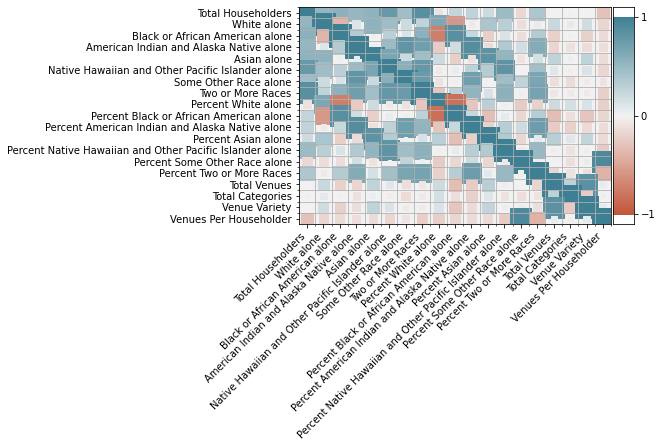

In [80]:
corrplot(corr_data)

###### Preliminary Results & Discussion


*   Positive correllations between populations totals and percentages expected
*   Negative correlations between Black and White racial groups reflect racial segregation primarily among White and Black populations
*   Slight negative correlations between specific communities of color (people who identify as Black, American Indian and Alaska Native, Some Other Race, and Teo or More Races) and venues (totals and variety)



##### Venue Categories & Race

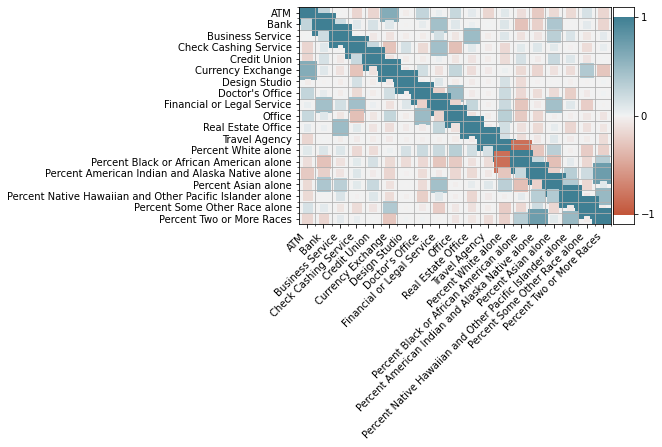

In [81]:
corrplot(onehot_grouped.corr())

###### Preliminary Results & Discussoin


*   **Negative** correlations between most racial groups (except White and Some Other Race) and ATMs
*   **Negative** correlations between most racial groups (except Asian, White and Some Other Race) and Banks.
    * **Strong positive** correlation between Banks and Asian populations
* **Strong positive** correlation between Currency Exchange and people who identify as Some Other Race
* **Negative** correlations between Black or African American populations and all venues except Credit Unions
* **Positive** correlations between White populations and all venues except Credit Unions



## Machine Learning Approaches

**Predictive Approaches**
   * User regression to determine whether type or quantity of financial services can be predicted based on the race of householders (i.e. Does the percentage or number of Asian householders impact the number of financial institutions?
   * User regression to determine whether the percentage of one race category can be determined given another (i.e. Does the percent or number of Black householders impact the percent or number of White householders, Asian householders, or householders of other races?)

### Installations and Imports

In [140]:
try:
  from sklearn.linear_model import LinearRegression
  from sklearn.model_selection import train_test_split
except:
  !pip install sklearn
  from sklearn.linear_model import LinearRegression
  from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt  # To visualize
from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model


### Analysis <a name="analysis"></a>

#### Linear Regrations By Race Alone

##### Configuring Race Data for Correllation

In [83]:
PercentBlack = census_data['Percent Black or African American alone'].values.reshape(-1, 1)  # values converts it into a numpy array
PercentWhite = census_data['Percent White alone'].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
PercentAsian = census_data['Percent Asian alone'].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
PercentAIAN = census_data['Percent American Indian and Alaska Native alone'].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
PercentNHPI = census_data['Percent Native Hawaiian and Other Pacific Islander alone'].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
PercentOtherRace = census_data['Percent Some Other Race alone'].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
PercentTwoOrMoreRace = census_data['Percent Two or More Races'].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column


##### Black Populations on White Populations

In [84]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentBlack, PercentWhite, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(X_train, y_train), 
                                                     reg.score(X_test, y_test), 
                                                     reg.score(PercentBlack, PercentWhite))

'F1 Scores ... Train: 0.7524804800833462, Test: 0.5523055993861433, Full: 0.6840553607079548'

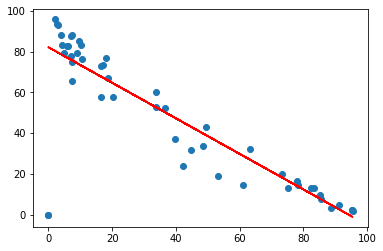

In [85]:
plt.scatter(PercentBlack, PercentWhite)
plt.plot(PercentBlack, reg.predict(PercentBlack), color="red")
plt.show()

##### Black Populations on Asian Populations

In [86]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentBlack, PercentWhite, test_size=0.33)

reg_BlackOnAsian = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg_BlackOnAsian.score(X_train, y_train), 
                                                     reg_BlackOnAsian.score(X_test, y_test), 
                                                     reg_BlackOnAsian.score(PercentBlack, PercentAsian))

'F1 Scores ... Train: 0.5801655426328224, Test: 0.8922776752937573, Full: -101.00292419160117'

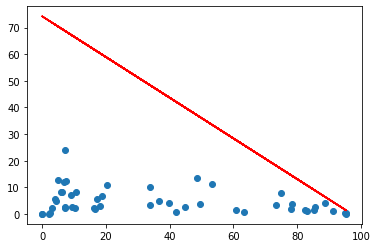

In [87]:
plt.scatter(PercentBlack, PercentAsian)
plt.plot(PercentBlack, reg_BlackOnAsian.predict(PercentBlack), color="red")
plt.show()

##### Asian Populations on White Populations

In [88]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentAsian, PercentWhite, test_size=0.33)

reg_AsianOnWhite = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg_AsianOnWhite.score(y_train, y_train), 
                                                     reg_AsianOnWhite.score(y_test, y_test), 
                                                     reg_AsianOnWhite.score(PercentAsian, PercentWhite))

'F1 Scores ... Train: -5.115605636876676, Test: -3.8357024908958954, Full: 0.07648785274650183'

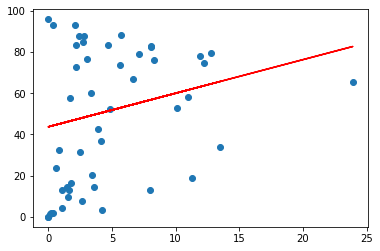

In [89]:
plt.scatter(PercentAsian, PercentWhite)
plt.plot(PercentAsian, reg_AsianOnWhite.predict(PercentAsian), color="red")
plt.show()

##### AIAN Populations on White Populations

In [90]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentAIAN, PercentWhite, test_size=0.33)

reg_AAINonWhite = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg_AAINonWhite.score(y_train, y_train), 
                                                     reg_AAINonWhite.score(y_test, y_test), 
                                                     reg_AAINonWhite.score(PercentAsian, PercentWhite))

'F1 Scores ... Train: -3865.106731345875, Test: -1784.0422685690362, Full: -32.90411574748897'

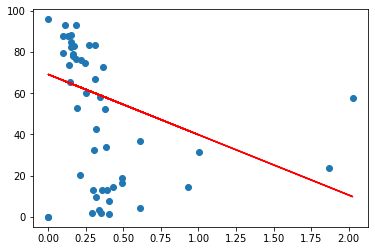

In [91]:
plt.scatter(PercentAIAN, PercentWhite)
plt.plot(PercentAIAN, reg_AAINonWhite.predict(PercentAIAN), color="red")
plt.show()

##### Preliminary Results & Discussion


*   **Strong negative** correlation between Black and White Populations
*   No clear correlations between Black and other populations analyzed
*   No clear correlations between White and other populations analyzed




#### Linear Regression By Race and Venues

##### Configuring Venue Data for Regression

In [126]:
#general venue aggregates
TotalVenues = census_data['Total Venues'].values.reshape(-1, 1)  # values converts it into a numpy array
TotalCategories = census_data['Total Categories'].values.reshape(-1, 1)  # values converts it into a numpy array
VenueVariety = census_data['Venue Variety'].values.reshape(-1, 1)  # values converts it into a numpy array

#venue types
ATMs = onehot_grouped['ATM'].values.reshape(-1, 1)
Banks = onehot_grouped['Bank'].values.reshape(-1, 1)
CreditUnions = onehot_grouped['Credit Union'].values.reshape(-1, 1)
CheckCashing = onehot_grouped['Check Cashing Service'].values.reshape(-1, 1)
FinancialOrLegal = onehot_grouped['Financial or Legal Service'].values.reshape(-1, 1)
CurrencyExchange = onehot_grouped['Currency Exchange'].values.reshape(-1, 1)


##### Black and White Race Populations on Total Venues

In [93]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentBlack, TotalVenues, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentBlack, TotalVenues))

'F1 Scores ... Train: -0.3950939793820547, Test: -1.3575923676135164, Full: 0.06369703437756868'

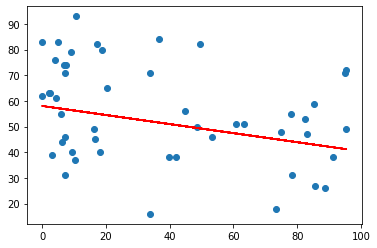

In [94]:
plt.scatter(PercentBlack, TotalVenues)
plt.plot(PercentBlack, reg.predict(PercentBlack), color="red")
plt.show()

In [95]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentWhite, TotalVenues, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentWhite, TotalVenues))

'F1 Scores ... Train: 0.18463325703413358, Test: 0.18464714927226478, Full: 0.03823579443549108'

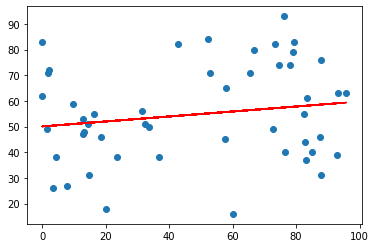

In [96]:
plt.scatter(PercentWhite, TotalVenues)
plt.plot(PercentWhite, reg.predict(PercentWhite), color="red")
plt.show()

In [97]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentWhite, TotalCategories, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentWhite, TotalCategories))

'F1 Scores ... Train: -0.11396934877160825, Test: -0.5583131257971228, Full: 0.007156132116124536'

In [98]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentBlack, TotalCategories, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentBlack, TotalCategories))

'F1 Scores ... Train: -0.0009431493044076422, Test: -0.07916803854177812, Full: -0.005518505058428769'

##### Black, White, and Asian Race Populations on Specific Venue Types

###### Black Population and Banks

In [99]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentBlack, Banks, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentBlack, Banks))

'F1 Scores ... Train: -0.1273878594643687, Test: -0.7090336913954314, Full: 0.020389999475708298'

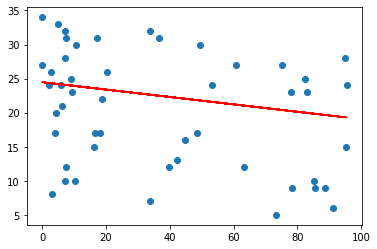

In [100]:
plt.scatter(PercentBlack, Banks)
plt.plot(PercentBlack, reg.predict(PercentBlack), color="red")
plt.show()

###### White Population and Banks

In [118]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentWhite, Banks, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentWhite, Banks))

'F1 Scores ... Train: 0.015355524988800773, Test: -0.10008250898166972, Full: -0.0019618566061878617'

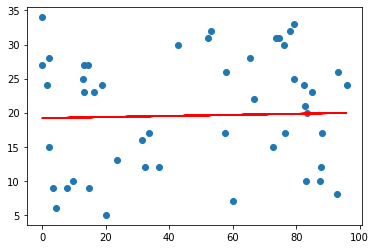

In [119]:
plt.scatter(PercentWhite, Banks)
plt.plot(PercentWhite, reg.predict(PercentWhite), color="red")
plt.show()

###### Asian Population and Banks

In [142]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentAsian, Banks, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentAsian, Banks))

'F1 Scores ... Train: -0.9946355551589602, Test: -1.0141302472755598, Full: 0.14439263643657196'

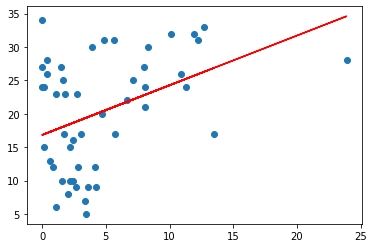

In [143]:
plt.scatter(PercentAsian, Banks)
plt.plot(PercentAsian, reg.predict(PercentAsian), color="red")
plt.show()

In [144]:
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_train_poly

array([[1.00000000e+00, 8.06066672e+00, 6.49743479e+01],
       [1.00000000e+00, 1.22146351e+01, 1.49197312e+02],
       [1.00000000e+00, 3.40533178e+00, 1.15962845e+01],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 4.85975212e+00, 2.36171907e+01],
       [1.00000000e+00, 6.18415025e-01, 3.82437143e-01],
       [1.00000000e+00, 1.79211470e-01, 3.21167508e-02],
       [1.00000000e+00, 4.66738197e+00, 2.17844545e+01],
       [1.00000000e+00, 1.41219472e-01, 1.99429392e-02],
       [1.00000000e+00, 1.45868825e+00, 2.12777140e+00],
       [1.00000000e+00, 1.35090041e+01, 1.82493191e+02],
       [1.00000000e+00, 3.35500105e+00, 1.12560320e+01],
       [1.00000000e+00, 3.62087327e-01, 1.31107232e-01],
       [1.00000000e+00, 3.91040481e+00, 1.52912657e+01],
       [1.00000000e+00, 1.68824701e+00, 2.85017797e+00],
       [1.00000000e+00, 3.59294556e+00, 1.29092578e+01],
       [1.00000000e+00, 1.62416634e+00, 2.63791630e+00],
       [1.00000000e+00, 2.20989

In [145]:
clf = linear_model.LinearRegression()
train_y_ = clf.fit(X_train_poly, y_train)
# The coefficients
print ('Coefficients: ', clf.coef_)
print ('Intercept: ', clf.intercept_)

Coefficients:  [[ 0.         -0.67875766  0.11050627]]
Intercept:  [18.98148876]


Text(0, 0.5, 'Currency Exchange')

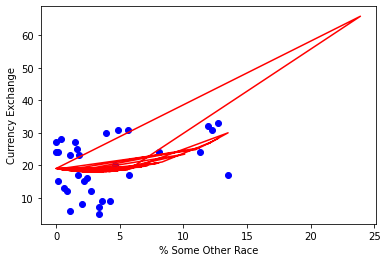

In [146]:
plt.scatter(X_train, y_train,  color='blue')
XX = PercentAsian
yy = clf.intercept_[0]+ clf.coef_[0][1]*XX+ clf.coef_[0][2]*np.power(XX, 2)
plt.plot(XX, yy, '-r' )
plt.xlabel("% Some Other Race")
plt.ylabel("Currency Exchange")

###### Black Population and Check Cashing Services

In [120]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentBlack, CheckCashing, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentBlack, CheckCashing))

'F1 Scores ... Train: 0.0004966957631161728, Test: -0.0006355581720205449, Full: 0.000997394017742459'

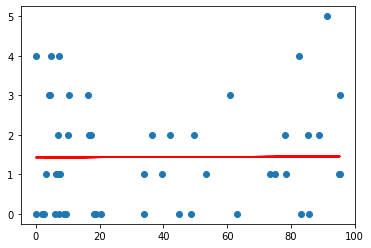

In [121]:
plt.scatter(PercentBlack, CheckCashing)
plt.plot(PercentBlack, reg.predict(PercentBlack), color="red")
plt.show()

###### White Population and Check Cashing

In [113]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentWhite, CheckCashing, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentWhite, VenueVariety))

'F1 Scores ... Train: 0.06494147005901196, Test: 0.07651512061105992, Full: -2.2745160662388333'

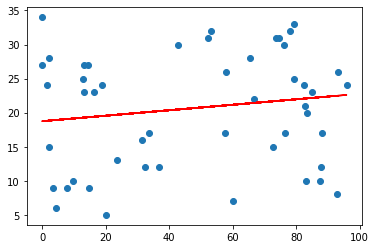

In [114]:
plt.scatter(PercentWhite, Banks)
plt.plot(PercentWhite, reg.predict(PercentWhite), color="red")
plt.show()

###### Black Population and Currency Exchange

In [127]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentBlack, CurrencyExchange, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentBlack, CurrencyExchange))

'F1 Scores ... Train: -0.024142959248560247, Test: -0.022911291734296624, Full: 0.020602494663483628'

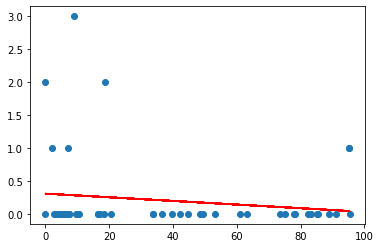

In [128]:
plt.scatter(PercentBlack, CurrencyExchange)
plt.plot(PercentBlack, reg.predict(PercentBlack), color="red")
plt.show()

###### Some Other Race Population and Currency Exchange

In [131]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentOtherRace, CurrencyExchange, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentOtherRace, CurrencyExchange))

'F1 Scores ... Train: -0.029521581911968745, Test: -0.09897128713093806, Full: 0.10597308326767685'

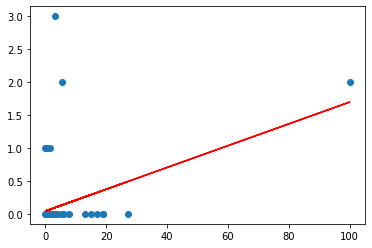

In [132]:
plt.scatter(PercentOtherRace, CurrencyExchange)
plt.plot(PercentOtherRace, reg.predict(PercentOtherRace), color="red")
plt.show()

In [133]:
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_train_poly

array([[1.00000000e+00, 9.84381152e-01, 9.69006253e-01],
       [1.00000000e+00, 3.25262017e-01, 1.05795379e-01],
       [1.00000000e+00, 8.21420952e-01, 6.74732380e-01],
       [1.00000000e+00, 1.01539469e+00, 1.03102638e+00],
       [1.00000000e+00, 2.22628850e+00, 4.95636050e+00],
       [1.00000000e+00, 8.36738665e-01, 7.00131594e-01],
       [1.00000000e+00, 1.00000000e+02, 1.00000000e+04],
       [1.00000000e+00, 1.19331742e+00, 1.42400647e+00],
       [1.00000000e+00, 3.64349776e+00, 1.32750759e+01],
       [1.00000000e+00, 5.33542566e-01, 2.84667669e-01],
       [1.00000000e+00, 1.61968065e+00, 2.62336540e+00],
       [1.00000000e+00, 1.42428208e+00, 2.02857946e+00],
       [1.00000000e+00, 6.25558534e-01, 3.91323480e-01],
       [1.00000000e+00, 1.50086717e+01, 2.25260226e+02],
       [1.00000000e+00, 2.78278046e+00, 7.74386707e+00],
       [1.00000000e+00, 7.44450460e-01, 5.54206488e-01],
       [1.00000000e+00, 1.31496556e+01, 1.72913443e+02],
       [1.00000000e+00, 0.00000

In [134]:
clf = linear_model.LinearRegression()
train_y_ = clf.fit(X_train_poly, y_train)
# The coefficients
print ('Coefficients: ', clf.coef_)
print ('Intercept: ', clf.intercept_)

Coefficients:  [[ 0.         -0.0162214   0.00034871]]
Intercept:  [0.13992259]


Text(0, 0.5, 'Currency Exchange')

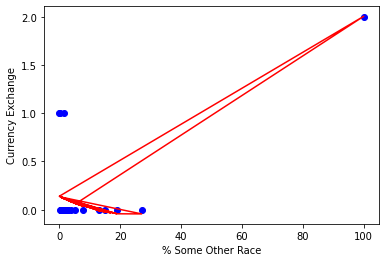

In [137]:
plt.scatter(X_train, y_train,  color='blue')
XX = PercentOtherRace
yy = clf.intercept_[0]+ clf.coef_[0][1]*XX+ clf.coef_[0][2]*np.power(XX, 2)
plt.plot(XX, yy, '-r' )
plt.xlabel("% Some Other Race")
plt.ylabel("Currency Exchange")

###### Black Population and Venue **Variety**

In [107]:
lr = LinearRegression()

X_train, X_test, y_train, y_test = train_test_split(PercentBlack, VenueVariety, test_size=0.33)

reg = lr.fit(X_train, y_train)
"F1 Scores ... Train: {}, Test: {}, Full: {}".format(reg.score(y_train, y_train), 
                                                     reg.score(y_test, y_test), 
                                                     reg.score(PercentBlack, VenueVariety))

'F1 Scores ... Train: -0.06707601848710198, Test: -0.2857524155844864, Full: 0.021971315111839806'

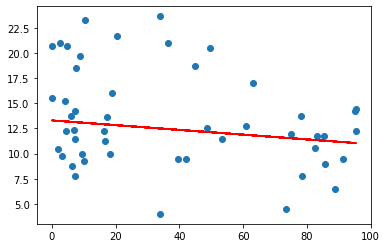

In [108]:
plt.scatter(PercentBlack, VenueVariety)
plt.plot(PercentBlack, reg.predict(PercentBlack), color="red")
plt.show()

## Results and Discussion <a name="results"></a>

### Correllations between Racial Populations
The impact of one racial population group on another


*   Positive correllations between populations totals and percentages expected
*   Negative correlations between Black and White racial groups reflect racial segregation primarily among White and Black populations
*   Slight negative correlations between specific communities of color (people who identify as Black, American Indian and Alaska Native, Some Other Race, and Teo or More Races) and venues (totals and variety)



### Correlations between Racial Groups and Venues


*   **Negative** correlations between most racial groups (except White and Some Other Race) and ATMs
*   **Negative** correlations between most racial groups (except Asian, White and Some Other Race) and Banks.
    * **Strong positive** correlation between Banks and Asian populations
* **Strong positive** correlation between Currency Exchange and people who identify as Some Other Race
* **Negative** correlations between Black or African American populations and all venues except Credit Unions
* **Positive** correlations between White populations and all venues except Credit Unions



# Conclusion <a name="conclusion"></a>

#### Business Question
This research effort seeks to answer the following question:
> Does the proportion of people of any particular race in a neighborhoods in Philadelphia impact the neighborhood's access to financial services?

#### Response
More evaluation needed
> Correlations exist for some racial groups and financial services that reflect disparities between access to Banks and ATMs for many non-white racial groups. However, more analysis is needed to understand the degree of impact and what other specific factors can be combined with specific racial groups to predict outcomes.

*   **Negative** correlations between most racial groups (except White and Some Other Race) and ATMs
*   **Negative** correlations between most racial groups (except Asian, White and Some Other Race) and Banks.
    * **Strong positive** correlation between Banks and Asian populations
* **Strong positive** correlation between Currency Exchange and people who identify as Some Other Race
* **Negative** correlations between Black or African American populations and all venues except Credit Unions
* **Positive** correlations between White populations and all venues except Credit Unions

